# ANKUR GURIA : 17039 : DSE 601

In [ ]:
import numpy as np
import tensorflow as tf
from keras import layers
from keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D
from keras.models import Model, load_model
from keras.preprocessing import image
from keras.utils import layer_utils
from keras.utils.data_utils import get_file
from keras.applications.imagenet_utils import preprocess_input
import pydot
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from keras.utils import plot_model
#from resnets_utils import *
from keras.initializers import glorot_uniform
import scipy.misc
from matplotlib.pyplot import imshow
%matplotlib inline

import keras.backend as K
K.set_image_data_format('channels_last')
K.set_learning_phase(1)

#Import some packages to use
import cv2
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline 

#To see our directory
import os
import random
import gc   #Gabage collector for cleaning deleted data from memory


Using TensorFlow backend.


In [ ]:
train_dir = '../input/big-dataset/big dataset/Big Dataset'
test_dir = '../input/english-test-data-2/english test data 2/English Test Data 2'

train_normal = ['../input/big-dataset/big dataset/Big Dataset/English Handwritten Datab/{}'.format(i) for i in os.listdir(train_dir + '/' + 'English Handwritten Datab')]  #get normal word images
train_struck_out = ['../input/big-dataset/big dataset/Big Dataset/English Struck Out Datab/{}'.format(i) for i in os.listdir(train_dir + '/' + 'English Struck Out Datab')]  #get struck out word images

test_imgs = ['../input/english-test-data-2/english test data 2/English Test Data 2/{}'.format(i) for i in os.listdir(test_dir)] #get test images

train_imgs = train_normal[:np.max([len(train_normal), len(train_struck_out)])] + train_struck_out[:np.max([len(train_normal), len(train_struck_out)])]  # slice the dataset and use same number of images in each class
random.shuffle(train_imgs)  # shuffle it randomly

#Clear list that are useless
#del train_normal
#del train_struck_out
gc.collect()   #collect garbage to save memory

12

In [ ]:
#Lets declare our image dimensions
#we are using coloured images. 
nrows = 200
ncolumns = 200
channels = 3  #change to 1 if you want to use grayscale image


#A function to read and process the images to an acceptable format for our model
def read_and_process_image(list_of_images):
    """
    Returns two arrays: 
        X is an array of resized images
        y is an array of labels
    """
    X = [] # images
    y = [] # labels
    
    for image in list_of_images:
        #print("1")
        X.append(cv2.resize(cv2.imread(image, cv2.IMREAD_COLOR), (nrows,ncolumns), interpolation=cv2.INTER_CUBIC))  #Read the image
        #get the labels
        if 'Handwritten' in image:
            y.append(1)
        elif 'Struck Out' in image:
            y.append(0)
    
    return X, y

In [ ]:
#A function to read and process the images to an acceptable format for our model
def read_and_process_image_new(list_of_images):
    """
    Returns two arrays: 
        X is an array of resized images
        y is an array of labels
    """
    X = [] # images
    y = [] # labels
    
    for image in list_of_images:
        #print("1")
        X.append(cv2.resize(cv2.imread(image, cv2.IMREAD_COLOR), (nrows,ncolumns), interpolation=cv2.INTER_CUBIC))  #Read the image
        #get the labels
        if '(' in image:
            y.append(0)
        else:
            y.append(1)
    
    return X, y

In [ ]:
X, y = read_and_process_image(train_imgs)
X_new_test, y_new_test = read_and_process_image_new(test_imgs)

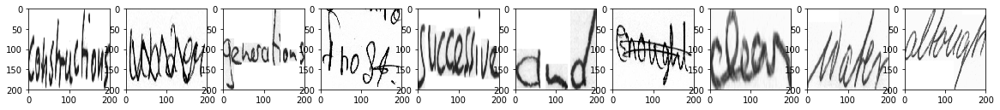

In [ ]:
#Lets view some of the pics
plt.figure(figsize=(20,10))
columns = 10
for i in range(columns):
    plt.subplot(5 / columns + 1, columns, i + 1)
    plt.imshow(X[i])

Text(0.5, 1.0, 'Labels for Struck out Words and Normal Words')

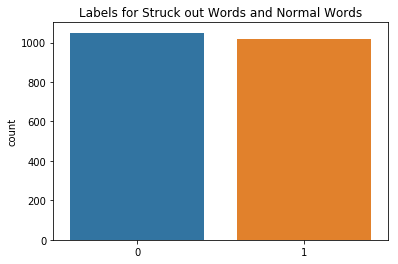

In [ ]:
import seaborn as sns
del train_imgs
gc.collect()

#Convert list to numpy array
X = np.array(X)
y = np.array(y)
X_new_test = np.array(X_new_test)
y_new_test = np.array(y_new_test)

#Lets plot the label to be sure we just have two class
sns.countplot(y)
plt.title('Labels for Struck out Words and Normal Words')

In [ ]:
#Lets split the data into train and test set
from sklearn.model_selection import train_test_split
X_train_orig, X_test_orig, Y_train_orig, Y_test_orig = train_test_split(X, y, test_size=0.20, random_state=2)

In [ ]:
# Normalize image vectors
X_train = X_train_orig/255.
X_test = X_test_orig/255.
X_new_test = X_new_test/255.

from tensorflow.python.keras import backend as K
sess = K.get_session()

# Convert training and test labels to one hot matrices
Y_train = tf.one_hot(Y_train_orig, 2)
Y_test = tf.one_hot(Y_test_orig, 2)
y_new_test_ = tf.one_hot(y_new_test, 2)

Y_train = sess.run(Y_train)
Y_test = sess.run(Y_test)
y_new_test_ = sess.run(y_new_test_)

print ("number of training examples = " + str(X_train.shape[0]))
print ("number of test examples = " + str(X_test.shape[0]))
print ("X_train shape: " + str(X_train.shape))
print ("Y_train shape: " + str(Y_train.shape))
print ("X_test shape: " + str(X_test.shape))
print ("Y_test shape: " + str(Y_test.shape))

number of training examples = 1655
number of test examples = 414
X_train shape: (1655, 200, 200, 3)
Y_train shape: (1655, 2)
X_test shape: (414, 200, 200, 3)
Y_test shape: (414, 2)


In [ ]:
def identity_block(X, f, filters, stage, block):
    """
    Implementation of the identity block as defined in Figure 3
    
    Arguments:
    X -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    f -- integer, specifying the shape of the middle CONV's window for the main path
    filters -- python list of integers, defining the number of filters in the CONV layers of the main path
    stage -- integer, used to name the layers, depending on their position in the network
    block -- string/character, used to name the layers, depending on their position in the network
    
    Returns:
    X -- output of the identity block, tensor of shape (n_H, n_W, n_C)
    """
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    # Save the input value. You'll need this later to add back to the main path. 
    X_shortcut = X
    
    # First component of main path
    X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)
    
    ### START CODE HERE ###
    
    # Second component of main path (≈3 lines)
    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)
    

    # Third component of main path (≈2 lines)
    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation (≈2 lines)
    X = Add()([X,X_shortcut])
    X = Activation("relu")(X)
    
    ### END CODE HERE ###
    
    return X

In [ ]:
tf.reset_default_graph()

with tf.Session() as test:
    np.random.seed(1)
    A_prev = tf.placeholder("float", [3, 4, 4, 6])
    X = np.random.randn(3, 4, 4, 6)
    A = identity_block(A_prev, f = 2, filters = [2, 4, 6], stage = 1, block = 'a')
    test.run(tf.global_variables_initializer())
    out = test.run([A], feed_dict={A_prev: X, K.learning_phase(): 0})
    print("out = " + str(out[0][1][1][0]))

Instructions for updating:
Colocations handled automatically by placer.
out = [0.19716814 0.         1.3561226  2.1713073  0.         1.3324987 ]


In [ ]:
def convolutional_block(X, f, filters, stage, block, s = 2):
    """
    Implementation of the convolutional block as defined in Figure 4
    
    Arguments:
    X -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    f -- integer, specifying the shape of the middle CONV's window for the main path
    filters -- python list of integers, defining the number of filters in the CONV layers of the main path
    stage -- integer, used to name the layers, depending on their position in the network
    block -- string/character, used to name the layers, depending on their position in the network
    s -- Integer, specifying the stride to be used
    
    Returns:
    X -- output of the convolutional block, tensor of shape (n_H, n_W, n_C)
    """
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    # Save the input value
    X_shortcut = X


    ##### MAIN PATH #####
    # First component of main path 
    X = Conv2D(F1, (1, 1), strides = (s,s), name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)
    
    ### START CODE HERE ###

    # Second component of main path (≈3 lines)
    X = Conv2D(F2, (f, f), strides = (1,1),padding = "same", name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path (≈2 lines)
    X = Conv2D(F3, (1, 1), strides = (1,1), name = conv_name_base + '2c', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)
    
    ##### SHORTCUT PATH #### (≈2 lines)
    X_shortcut = Conv2D(F3, (1, 1), strides = (s,s), name = conv_name_base + '1', kernel_initializer = glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis = 3, name = bn_name_base + '1')(X_shortcut)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation (≈2 lines)
    X = Add()([X,X_shortcut])
    X = Activation('relu')(X)
    
    ### END CODE HERE ###
    
    return X

In [ ]:
tf.reset_default_graph()

with tf.Session() as test:
    np.random.seed(1)
    A_prev = tf.placeholder("float", [3, 4, 4, 6])
    X = np.random.randn(3, 4, 4, 6)
    A = convolutional_block(A_prev, f = 2, filters = [2, 4, 6], stage = 1, block = 'a')
    test.run(tf.global_variables_initializer())
    out = test.run([A], feed_dict={A_prev: X, K.learning_phase(): 0})
    print("out = " + str(out[0][1][1][0]))

out = [0.09018461 1.2348977  0.46822017 0.0367176  0.         0.655166  ]


In [ ]:
def ResNet50(input_shape = (200, 200, 3), classes = 2):
    """
    Implementation of the popular ResNet50 the following architecture:
    CONV2D -> BATCHNORM -> RELU -> MAXPOOL -> CONVBLOCK -> IDBLOCK*2 -> CONVBLOCK -> IDBLOCK*3
    -> CONVBLOCK -> IDBLOCK*5 -> CONVBLOCK -> IDBLOCK*2 -> AVGPOOL -> TOPLAYER

    Arguments:
    input_shape -- shape of the images of the dataset
    classes -- integer, number of classes

    Returns:
    model -- a Model() instance in Keras
    """
    
    # Define the input as a tensor with shape input_shape
    X_input = Input(input_shape)

    
    # Zero-Padding
    X = ZeroPadding2D((3, 3))(X_input)
    
    # Stage 1
    X = Conv2D(64, (7, 7), strides = (2, 2), name = 'conv1', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    # Stage 2
    X = convolutional_block(X, f = 3, filters = [200, 200, 256], stage = 2, block='a', s = 1)
    X = identity_block(X, 3, [200, 200, 256], stage=2, block='b')
    X = identity_block(X, 3, [200, 200, 256], stage=2, block='c')

    ### START CODE HERE ###

    # Stage 3 (≈4 lines)
    X = convolutional_block(X, f = 3, filters = [400, 400, 512], stage = 3, block='a', s = 2)
    X = identity_block(X, 3, [400, 400, 512], stage=3, block='b')
    X = identity_block(X, 3, [400, 400, 512], stage=3, block='c')
    X = identity_block(X, 3, [400, 400, 512], stage=3, block='d')

    # Stage 4 (≈6 lines)
    X = convolutional_block(X, f = 3, filters = [800, 800, 1024], stage = 4, block='a', s = 2)
    X = identity_block(X, 3, [800, 800, 1024], stage=4, block='b')
    X = identity_block(X, 3, [800, 800, 1024], stage=4, block='c')
    X = identity_block(X, 3, [800, 800, 1024], stage=4, block='d')
    X = identity_block(X, 3, [800, 800, 1024], stage=4, block='e')
    X = identity_block(X, 3, [800, 800, 1024], stage=4, block='f')

    # Stage 5 (≈3 lines)
    X = convolutional_block(X, f = 3, filters = [1600, 1600, 2048], stage = 5, block='a', s = 2)
    X = identity_block(X, 3, [1600, 1600, 2048], stage=5, block='c')
    X = identity_block(X, 3, [1600, 1600, 2048], stage=5, block='d')

    # AVGPOOL (≈1 line). Use "X = AveragePooling2D(...)(X)"
    X = AveragePooling2D(pool_size=(2,2),name = "avg_pool")(X)
    
    ### END CODE HERE ###

    # output layer
    X = Flatten()(X)
    X = Dense(classes, activation='softmax', name='fc' + str(classes), kernel_initializer = glorot_uniform(seed=0))(X)
    
    
    # Create model
    model = Model(inputs = X_input, outputs = X, name='ResNet50')

    return model

In [ ]:
model = ResNet50(input_shape = (200, 200, 3), classes = 2)

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.fit(X_train, Y_train, epochs = 40, batch_size = 32)

Instructions for updating:
Use tf.cast instead.
Epoch 1/40
1655/1655 [==============================] - 47s 29ms/step - loss: 0.3764 - acc: 0.9275
Epoch 2/40
1655/1655 [==============================] - 28s 17ms/step - loss: 0.0359 - acc: 0.9873
Epoch 3/40
1655/1655 [==============================] - 28s 17ms/step - loss: 0.0139 - acc: 0.9946
Epoch 4/40
1655/1655 [==============================] - 28s 17ms/step - loss: 0.0302 - acc: 0.9909
Epoch 5/40
1655/1655 [==============================] - 28s 17ms/step - loss: 0.0746 - acc: 0.9776
Epoch 6/40
1655/1655 [==============================] - 28s 17ms/step - loss: 0.0306 - acc: 0.9921
Epoch 7/40
1655/1655 [==============================] - 28s 17ms/step - loss: 0.0109 - acc: 0.9970
Epoch 8/40
1655/1655 [==============================] - 28s 17ms/step - loss: 0.0091 - acc: 0.9958
Epoch 9/40
1655/1655 [==============================] - 28s 17ms/step - loss: 0.0083 - acc: 0.9970
Epoch 10/40
1655/1655 [==============================] - 28s 

In [ ]:
preds = model.evaluate(X_new_test, y_new_test_)
print ("Loss = " + str(preds[0]))
print ("Test Accuracy = " + str(preds[1]))

187/187 [==============================] - 3s 15ms/step
Loss = 3.5830959514279e-05
Test Accuracy = 1.0


In [ ]:
import sklearn

predictions = []
for i in model.predict(X_new_test):
    predictions.append(list(i).index(np.max(i)))
    
sklearn.metrics.f1_score(y_new_test, predictions)

1.0

In [ ]:
import sklearn

predictions_ = []
for i in model.predict(X_test):
    predictions_.append(list(i).index(np.max(i)))
    
sklearn.metrics.f1_score(Y_test_orig, predictions_)

1.0

In [ ]:
preds = model.evaluate(X_test, Y_test)
print ("Loss = " + str(preds[0]))
print ("Test Accuracy = " + str(preds[1]))

414/414 [==============================] - 2s 5ms/step
Loss = 0.0005008099401427477
Test Accuracy = 1.0


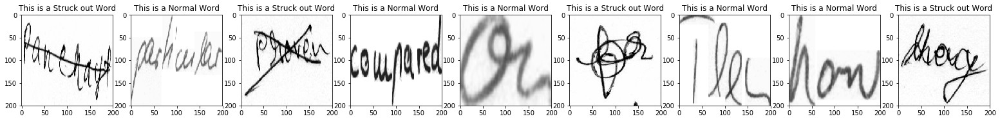

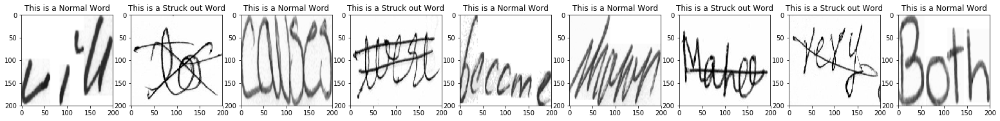

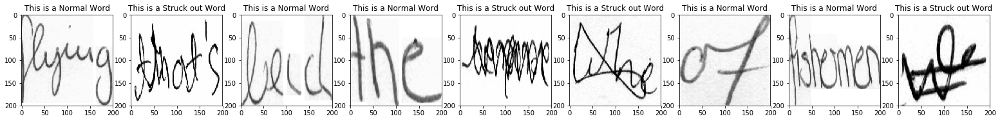

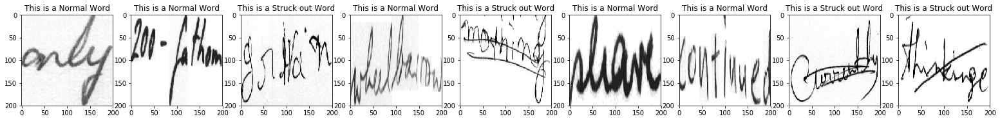

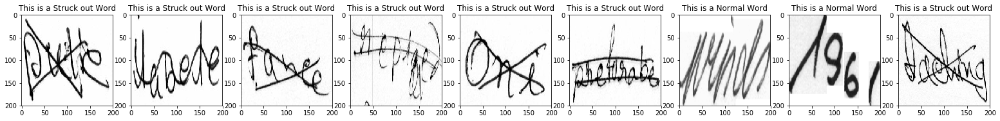

...

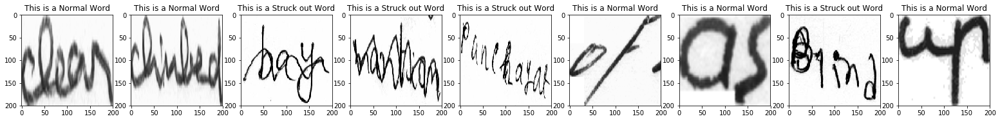

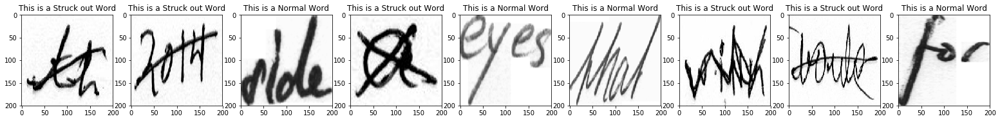

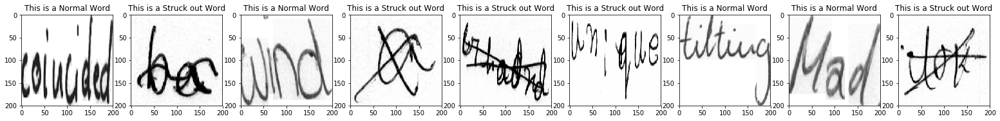

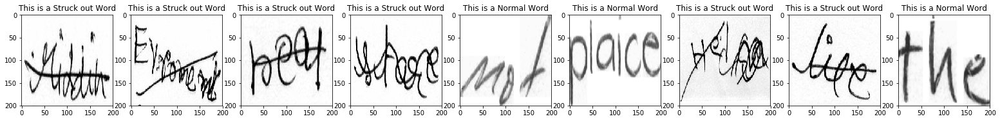

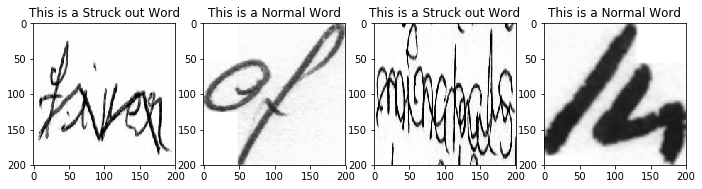

In [ ]:
import math
j = 0

while j <= math.floor(len(X_test)/10):
    i = 0
    text_labels = []
    plt.figure(figsize=(30,20))
    for pred in predictions_[j*10 : j*10 + 10]:
        #pred = model.predict(batch)
        if pred == 1:
            text_labels.append('Normal Word')
            #text_labels.append(1)
        else:
            text_labels.append('Struck out Word')
            #text_labels.append(0)
        plt.subplot(5 / columns + 1, columns, i + 1)
        plt.title('This is a ' + text_labels[i])
        imgplot = plt.imshow(X_test[j*10 + i])
        i += 1
        if i % 9 == 0:
            break
        #if i == len(x):
         #   break
    plt.show()
    j += 1